# Data Analysis Notebook

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
%cd drive/MyDrive/ECSE551/Project1/Project1.1/

[Errno 2] No such file or directory: 'drive/MyDrive/ECSE551/Project1/Project1.1/'
/content/drive/MyDrive/ECSE551/Project1/Project1.1


In [ ]:
# We can navigate to this directory using commands like %pwd and %cd
%cd /content/drive/MyDrive/Colab Notebooks/ECSE551 Mini Project/Project1/Project1/Project1.1

[Errno 2] No such file or directory: '/content/drive/MyDrive/Colab Notebooks/ECSE551 Mini Project/Project1/Project1/Project1.1'
/content/drive/MyDrive/ECSE551/Project1/Project1.1


Import necessary packets

In [ ]:
import pandas as pd, numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Load data

In [ ]:
df_Hepatits = pd.read_csv('Hepatits.csv')
df_Mushroom = pd.read_csv('Mushroom.csv')

Add Column Names

In [ ]:
#Saving original column labels has data and renaming columns
M_ColumnName = ['Poisonous', 'Cap-shape', 'Cap-surface', 'Cap-color', 'Bruises',
                'Odor', 'Gill-attachment',  'Gill-spacing', 'Gill-size',
                'Gill-color', 'Stalk-color-below-ring', 'Class']
row1 = pd.DataFrame([e for e in df_Mushroom.columns.values.astype('float64')]).T
row1.columns = M_ColumnName
df_Mushroom.columns=M_ColumnName
df_Mushroom = pd.concat([row1, df_Mushroom],ignore_index=True)
df_Mushroom.head()

,Poisonous,Cap-shape,Cap-surface,Cap-color,Bruises,Odor,Gill-attachment,Gill-spacing,Gill-size,Gill-color,Stalk-color-below-ring,Class
0,0.24779,0.35274,0.10,0.102740,0.113520,0.211270,0.095406,0.53485,0.66142,0.21557,0.36923,1.0
1,0.19469,0.32192,0.06,0.349320,0.080134,0.140850,0.042403,0.44974,0.52756,0.15569,0.36923,1.0
2,0.19469,0.32192,0.06,0.349320,0.080134,0.140850,0.042403,0.44974,0.52756,0.15569,0.36923,1.0
3,0.13274,0.30137,0.00,0.089041,0.111850,0.070423,0.010601,0.34703,0.66929,0.12575,0.47692,1.0
4,0.24779,0.27397,0.13,0.102740,0.110180,0.464790,0.194350,0.38225,0.54331,0.15569,0.36923,1.0


In [ ]:
#Saving original column labels as data and renaming columns
H_ColumnName = ['Ascites', 'Varices', 'Bilirubin', 'Alk Phosphate', 'Sgot',
                'Albumin', 'Protime', 'Histology', 'Class']
row1 = pd.DataFrame([e for e in df_Hepatits.columns.values.astype('float64')]).T
row1.columns = H_ColumnName
df_Hepatits.columns=H_ColumnName
df_Hepatits = pd.concat([row1, df_Hepatits],ignore_index=True)
df_Hepatits.head()

,Ascites,Varices,Bilirubin,Alk Phosphate,Sgot,Albumin,Protime,Histology,Class
0,0.117650,0.77889,0.42623,0.27273,0.638300,0.57675,0.069172,0.066667,1.0
1,0.176470,0.40201,0.67213,0.31313,0.082742,0.50969,0.518360,0.100000,1.0
2,0.058824,1.00000,0.62295,0.43434,0.000000,0.63934,0.561910,0.016667,1.0
3,0.470590,0.83920,0.86885,0.46465,0.273050,0.56036,0.037148,0.366670,1.0
4,0.529410,0.72864,0.65574,0.46465,0.153660,0.56483,0.238680,0.316670,1.0


# Statistical Analysis

## Visualize the Mushroom Dataset

Text(0.5, 1.0, 'Mushroom Dataset')

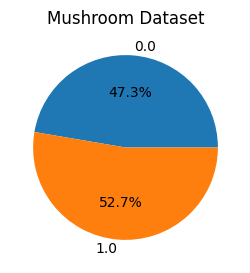

In [ ]:
df_Mushroom.groupby('Class').size().plot(kind='pie', autopct='%1.1f%%',
                                         figsize= (3,3))
plt.title('Mushroom Dataset')

### Scatter Plots of Features

In [ ]:
Mush_samples, Mush_features = df_Mushroom.shape
Mush_features = Mush_features -1 # exclude column 'Class'

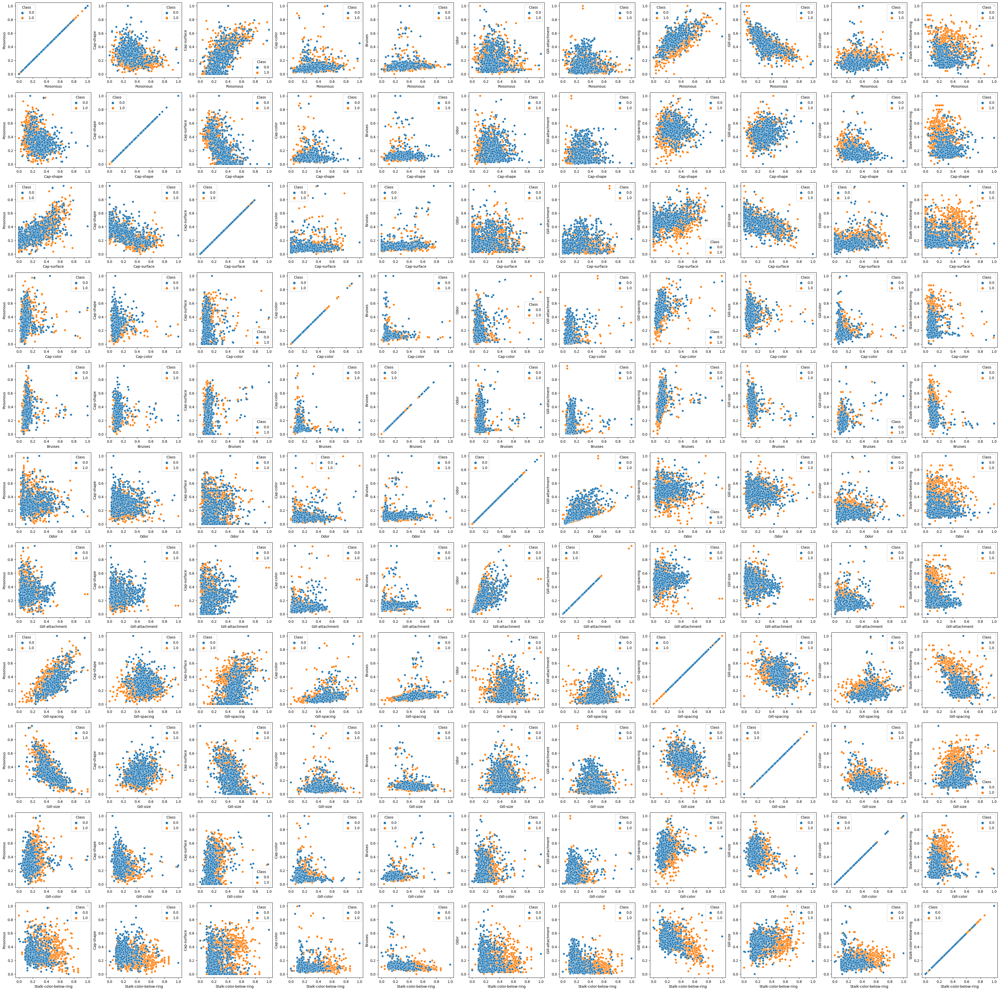

In [ ]:
fig, ax = plt.subplots(nrows=Mush_features, ncols=Mush_features,
                       figsize= (50,50))
for i in range(Mush_features):
    for j in range(Mush_features):
        sns.scatterplot(data=df_Mushroom, x=df_Mushroom.columns[i], y=df_Mushroom.columns[j], hue='Class', ax=ax[i][j])

### Histogram

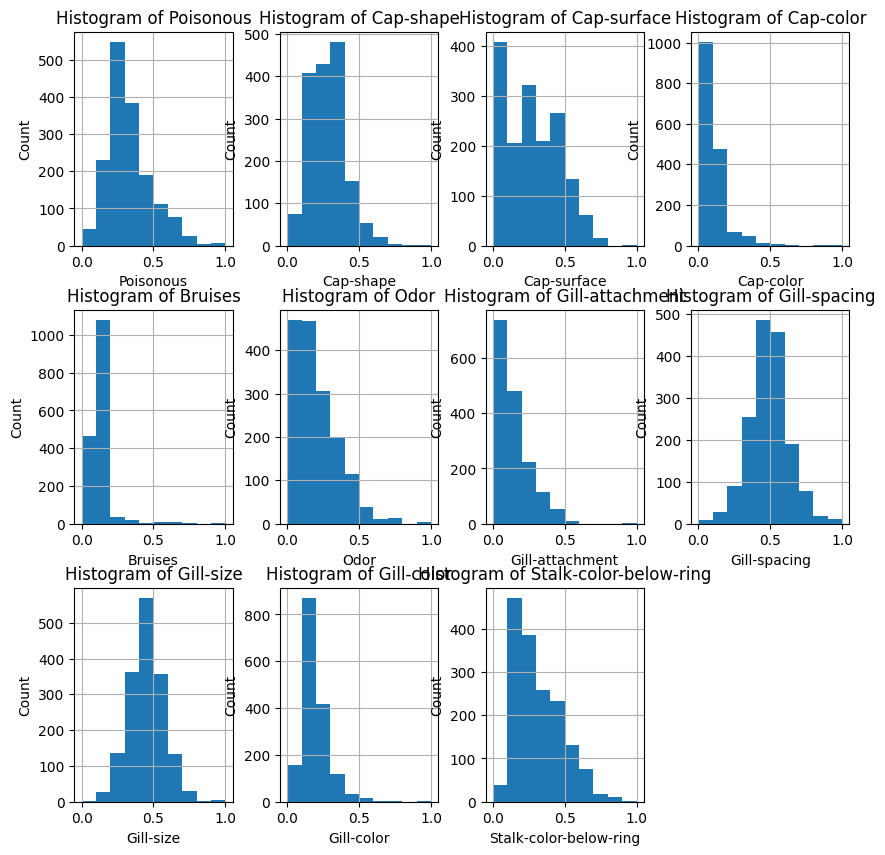

In [ ]:
fig, axs = plt.subplots(nrows=3, ncols=4, figsize= (10,10))
axs = axs.ravel()

for i in range(Mush_features):
    df_Mushroom.hist(column=df_Mushroom.columns[i], ax=axs[i])
    axs[i].set_title('Histogram of ' + df_Mushroom.columns[i])
    axs[i].set_xlabel(df_Mushroom.columns[i])
    axs[i].set_ylabel('Count')
axs[11].set_axis_off()

### Distributions of classes according to features

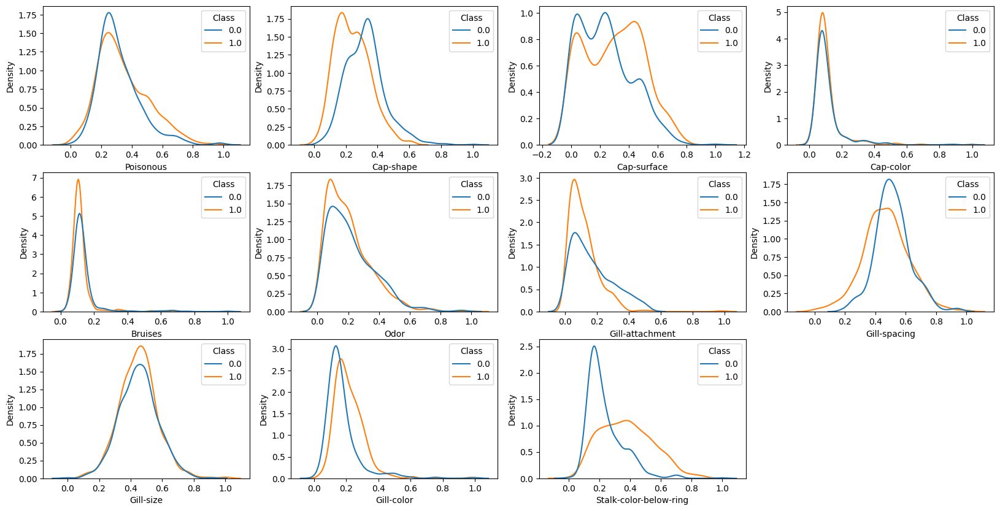

In [ ]:
fig, axes_ = plt.subplots(nrows=3, ncols=4, figsize= (20,10))
for i in range(Mush_features):
  sns.kdeplot(ax=axes_[i//4, i%4], data=df_Mushroom, x=df_Mushroom.columns[i],
              hue='Class')
axes_[2,3].set_axis_off()

Zoom in on some features we hypothesize will have small and large affects on classification, respectively.

<Axes: xlabel='Stalk-color-below-ring', ylabel='Density'>

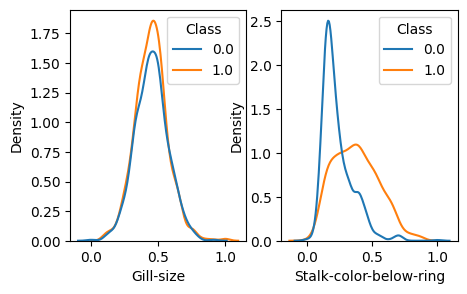

In [ ]:
fig, axes_ = plt.subplots(nrows=1, ncols=2, figsize= (5,3))

sns.kdeplot(ax=axes_[0], data=df_Mushroom, x='Gill-size', hue='Class')
sns.kdeplot(ax=axes_[1], data=df_Mushroom, x='Stalk-color-below-ring',
            hue='Class')

Visualize the distributions of squared features

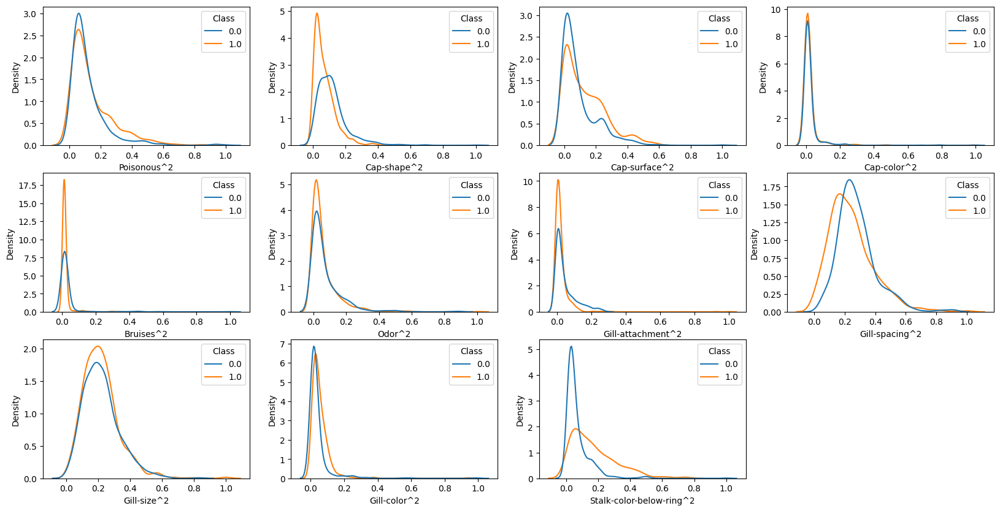

In [ ]:
fig, axes_ = plt.subplots(nrows=3, ncols=4, figsize= (20,10))
df_Mushroom_squared = df_Mushroom.apply(lambda x: x**2)

headers = ['Poisonous^2', 'Cap-shape^2', 'Cap-surface^2', 'Cap-color^2',
           'Bruises^2', 'Odor^2', 'Gill-attachment^2',  'Gill-spacing^2',
           'Gill-size^2', 'Gill-color^2', 'Stalk-color-below-ring^2', 'Class']
df_Mushroom_squared.columns = headers

for i in range(Mush_features):
  sns.kdeplot(ax=axes_[i//4, i%4], data=df_Mushroom_squared,
              x=df_Mushroom_squared.columns[i], hue='Class')
axes_[2,3].set_axis_off()

## Visualize the Hepatits dataset

Text(0.5, 1.0, 'Hepatitis Dataset')

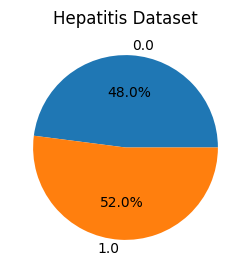

In [ ]:
df_Hepatits.groupby('Class').size().plot(kind='pie', autopct='%1.1f%%',
                                         figsize= (3,3))
plt.title('Hepatitis Dataset')

### Scattering

In [ ]:
Hep_samples, Hep_features = df_Hepatits.shape
Hep_features = Hep_features -1 # exclude column 'Class'

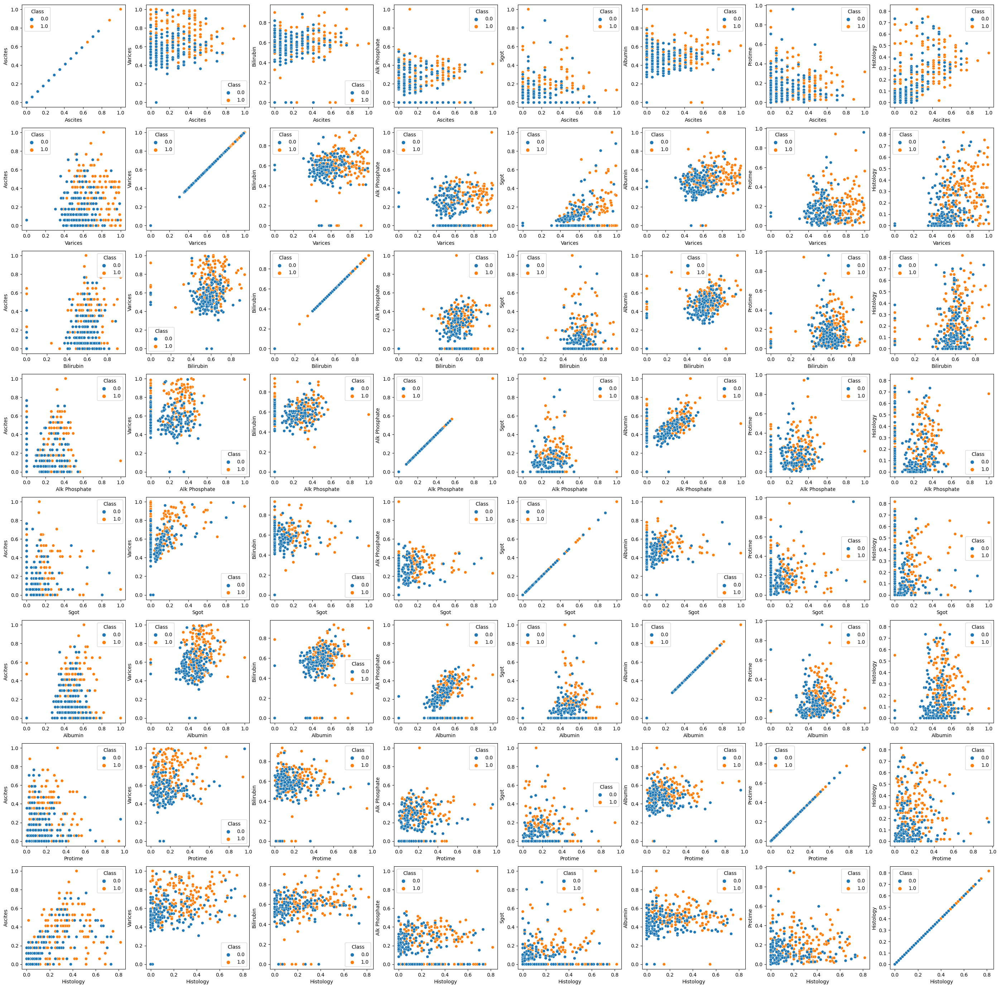

In [ ]:
fig, ax = plt.subplots(nrows=Hep_features, ncols=Hep_features, figsize= (35,35))
for i in range(Hep_features):
    for j in range(Hep_features):
        sns.scatterplot(data=df_Hepatits, x=df_Hepatits.columns[i],
                        y=df_Hepatits.columns[j], hue='Class', ax=ax[i][j])

### Histogram

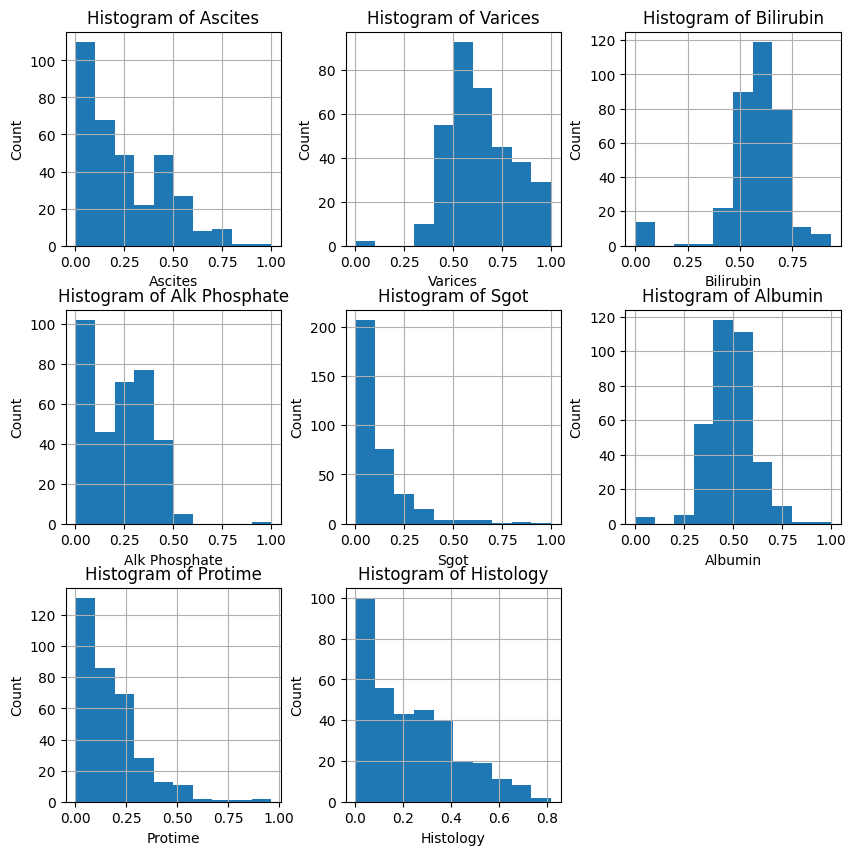

In [ ]:
# @title
fig, axs = plt.subplots(nrows=3, ncols=3, figsize= (10,10))
axs = axs.ravel()

for i in range(Hep_features):
    df_Hepatits.hist(column=df_Hepatits.columns[i], ax=axs[i])
    axs[i].set_title('Histogram of ' + df_Hepatits.columns[i])
    axs[i].set_xlabel(df_Hepatits.columns[i])
    axs[i].set_ylabel('Count')
axs[8].set_axis_off()

### Distributions of classes according to features

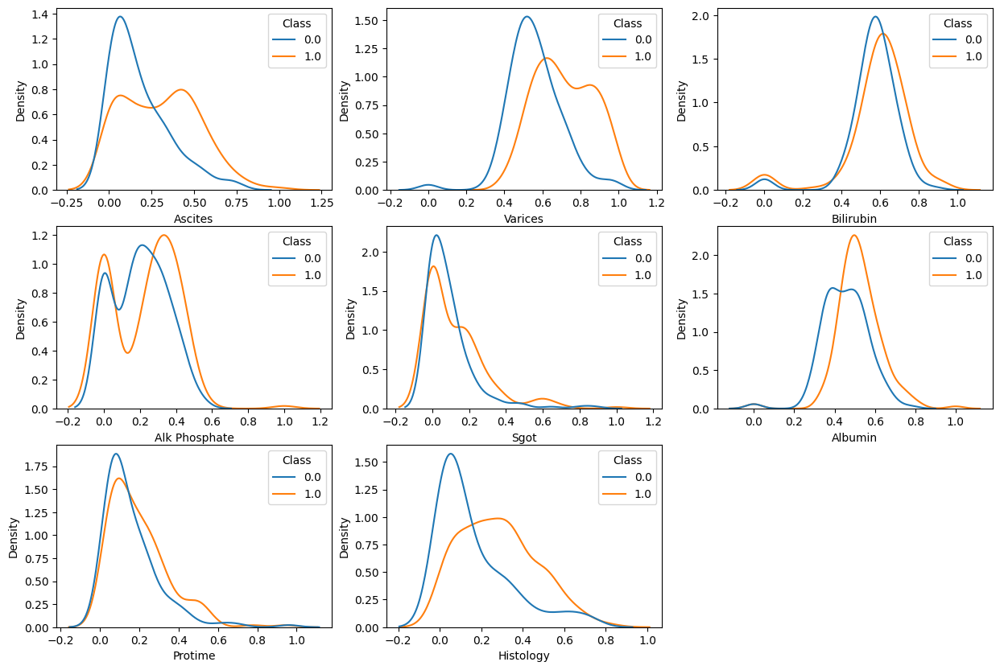

In [ ]:
fig, axes_ = plt.subplots(nrows=3, ncols=3, figsize= (15,10))
for i in range(Hep_features):
  sns.kdeplot(ax=axes_[i//3, i%3], data=df_Hepatits, x=df_Hepatits.columns[i],
              hue='Class')
axes_[2,2].set_axis_off()

Zoom in on some features we hypothesize will have small and large affects on classification, respectively.

<Axes: xlabel='Ascites', ylabel='Density'>

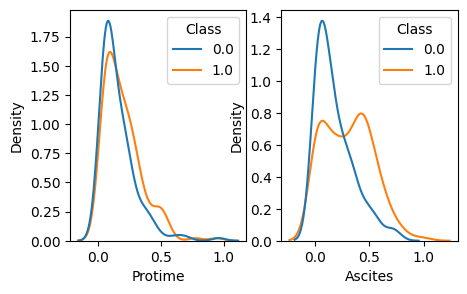

In [ ]:
fig, axes_ = plt.subplots(nrows=1, ncols=2, figsize= (5,3))
sns.kdeplot(ax=axes_[0], data=df_Hepatits, x='Protime', hue='Class')
sns.kdeplot(ax=axes_[1], data=df_Hepatits, x='Ascites', hue='Class')

Visualize the distribution of the squared features

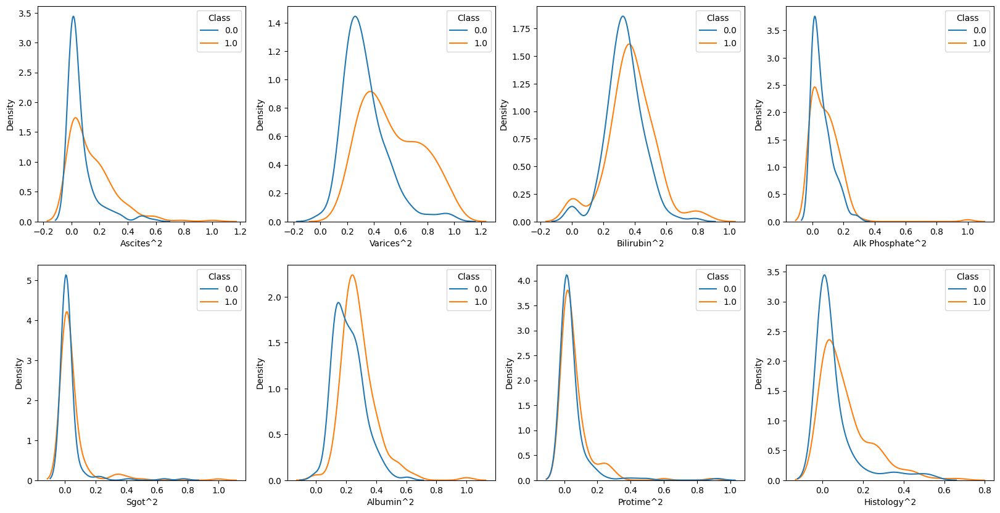

In [ ]:
fig, axes_ = plt.subplots(nrows=2, ncols=4, figsize= (20,10))
df_Hepatits_squared = df_Hepatits.apply(lambda x: x**2)

headers = ['Ascites^2', 'Varices^2', 'Bilirubin^2', 'Alk Phosphate^2', 'Sgot^2',
           'Albumin^2', 'Protime^2', 'Histology^2', 'Class']
df_Hepatits_squared.columns = headers

for i in range(Hep_features):
  sns.kdeplot(ax=axes_[i//4, i%4], data=df_Hepatits_squared,
              x=df_Hepatits_squared.columns[i], hue='Class')

## Perform PCA to the datasets

Principal Component Analysis, or PCA, is a powerful analytical tool widely used in machine learning and statistics to tackle complex datasets. Its main purpose is to simplify data analysis by reducing the dimensionality of a dataset, making it more manageable and interpretable. PCA can highlight hidden relationships and identify the most significant patterns within the dataset[1]. In our project, we undertook the task of implementing a custom version of PCA from the ground up.

[1] P. Schmalen, “Understand your data with principal component analysis164
(pca) and discover underlying patterns,” https://towardsdatascience.com/165
understand-your-data-with-principle-component-analysis-pca-and-discover-underlying-patterns-d6cadb020939,166
2020.

In [ ]:
class MyPCA:

    def __init__(self, n_components):
        self.n_components = n_components

    def fit(self, X):
        # Standardize data
        X = X.copy()
        self.mean = np.mean(X, axis = 0)
        self.scale = np.std(X, axis = 0)
        X_std = (X - self.mean) / self.scale

        # Eigendecomposition of covariance matrix
        covari = np.cov(X_std.T)
        eigen_vals, eigen_vecs = np.linalg.eig(covari)

        # Adjusting the eigenvectors that are largest in absolute value to be
        # positive
        max_idx = np.argmax(np.abs(eigen_vecs), axis=0)
        signs = np.sign(eigen_vecs[max_idx, range(eigen_vecs.shape[0])])
        eigen_vecs = eigen_vecs*signs[np.newaxis,:]
        eigen_vecs = eigen_vecs.T

        eigen_pairs = [(np.abs(eigen_vals[i]), eigen_vecs[i,:]) for i in range(len(eigen_vals))]
        eigen_pairs.sort(key=lambda x: x[0], reverse=True)
        eigen_vals_sorted = np.array([x[0] for x in eigen_pairs])
        eigen_vecs_sorted = np.array([x[1] for x in eigen_pairs])

        self.components = eigen_vecs_sorted[:self.n_components,:]

        # Explained variance ratio
        self.explained_variance_ratio = [i/np.sum(eigen_vals) for i in eigen_vals_sorted[:self.n_components]]

        self.cum_explained_variance = np.cumsum(self.explained_variance_ratio)

        return self

    def transform(self, X):
        X = X.copy()
        X_std = (X - self.mean) / self.scale
        X_proj = X_std.dot(self.components.T)

        return X_proj

Convert Dataframe into Numpy

In [ ]:
#Features of Mushroom Dataset
X_mush = pd.DataFrame.to_numpy(df_Mushroom.loc[:,'Poisonous':'Stalk-color-below-ring'])
#Class of Mushroom Dataset
Y_mush = pd.Series.to_numpy(df_Mushroom['Class'])


#Features of Hepatits Dataset
X_Hep = pd.DataFrame.to_numpy(df_Hepatits.loc[:,'Ascites':'Histology'])
#Class of Hepatits Dataset
Y_Hep = pd.Series.to_numpy(df_Hepatits['Class'])

### Apply to Mushroom Dataset

In [ ]:
pca_mush = MyPCA(n_components=2).fit(X_mush)

print('Components:',pca_mush.components)
print('Explained variance ratio:\n', pca_mush.explained_variance_ratio)
print('Cumulative explained variance:\n', pca_mush.cum_explained_variance)

new_X_mush = pca_mush.transform(X_mush)
print('Transformed data shape:', new_X_mush.shape)

Components: [[ 0.48803881 -0.23632816  0.46367087  0.14443318  0.21455575 -0.03045768
   0.03038027  0.39470416 -0.43987086  0.24325033 -0.11739775]
 [-0.10981178  0.28037221 -0.15580909  0.27080124  0.13905866  0.51035015
   0.56820193  0.23588567  0.01182385 -0.04961186 -0.3883707 ]]
Explained variance ratio:
 [0.281267863808838, 0.1749556218991337]
Cumulative explained variance:
 [0.28126786 0.45622349]
Transformed data shape: (1623, 2)


By selecting two principal components, our Mushroom dataset's dimensionality is reduced from 11 to 2. The first table above shows the component scores, highlighting the most influential features for each component.

The second table above presents the ‘Explained variance ratio’ score for each principal component. While each components captures a different pattern of variation in the data, the score tells us how much of the data’s total variability is accounted for by that specific pattern. Therefore, the first principal component is more influential in capturing the dominant patterns in the data, while the second component contributes to a lesser extent.

<function matplotlib.pyplot.legend(*args, **kwargs)>

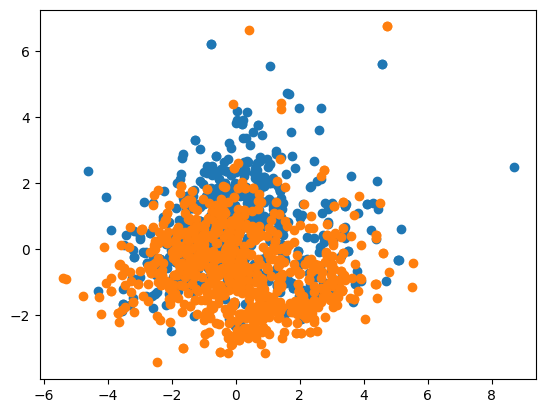

In [ ]:
for label in set(Y_mush):
    X_class_mush = new_X_mush[Y_mush == label]
    plt.scatter(X_class_mush[:, 0], X_class_mush[:, 1], label=label)
plt.legend

Compare with Scikit-learn

Components:
 [[ 0.48803881 -0.23632816  0.46367087  0.14443318  0.21455575 -0.03045768
   0.03038027  0.39470416 -0.43987086  0.24325033 -0.11739775]
 [-0.10981178  0.28037221 -0.15580909  0.27080124  0.13905866  0.51035015
   0.56820193  0.23588567  0.01182385 -0.04961186 -0.3883707 ]]
Explained variance ratio:
 [0.28126786 0.17495562]
Transformed data shape: (1623, 2)


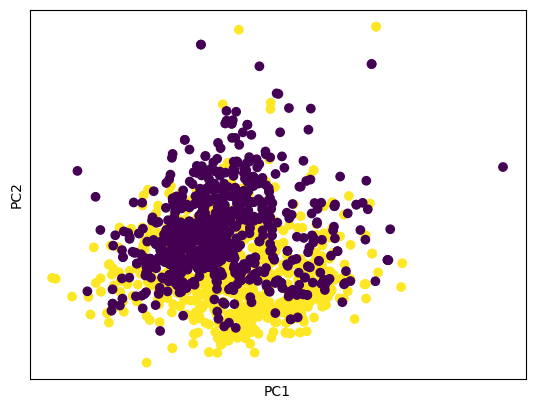

In [ ]:
from sklearn.preprocessing import StandardScaler
X_std = StandardScaler().fit_transform(X_mush)

from sklearn.decomposition import PCA
pca = PCA(n_components = 2).fit(X_std)

print('Components:\n', pca.components_)
print('Explained variance ratio:\n', pca.explained_variance_ratio_)
X_pca = pca.transform(X_std) # Apply dimensionality reduction to X.
print('Transformed data shape:', X_pca.shape)

plt.scatter(X_pca[:, 0], X_pca[:, 1], c = Y_mush)
plt.xlabel('PC1'); plt.xticks([])
plt.ylabel('PC2'); plt.yticks([])
plt.show()

### Apply to Hepatits Dataset

In [ ]:
pca_Hep = MyPCA(n_components =2).fit(X_Hep)

print('Components:',pca_Hep.components)
print('Explained variance ratio:\n', pca_Hep.explained_variance_ratio)

new_X_Hep = pca_Hep.transform(X_Hep)
print('Transformed data shape:', new_X_Hep.shape)

Components: [[ 0.14098447  0.40870009  0.33847256  0.45428543  0.43544749  0.43810166
   0.24823254  0.22131811]
 [ 0.60430589  0.15817567  0.15091662 -0.31923059 -0.2215835  -0.09051119
  -0.22449922  0.61434472]]
Explained variance ratio:
 [0.2642724617553562, 0.21215971555192878]
Transformed data shape: (344, 2)


In our analysis of the Hepatitis dataset, we also opted for two principal components using PCA. The first table above clearly identifies the most significant features: "Alk Phosphate" for the first component and "Ascites" for the second.

Analyzing the 'Explained variance ratio' table, we observe that the first principal component holds a stronger influence, while the second is only slightly less significant.

<function matplotlib.pyplot.legend(*args, **kwargs)>

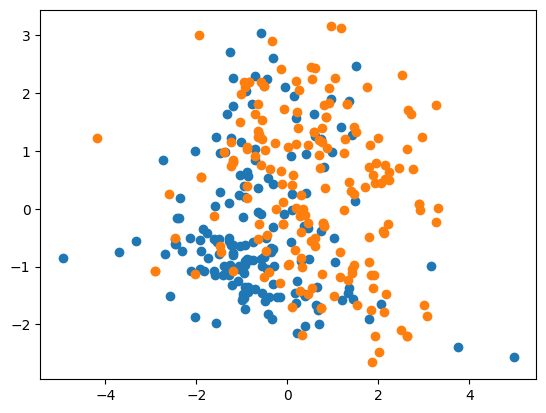

In [ ]:
for label in set(Y_Hep):
    X_class_Hep = new_X_Hep[Y_Hep == label]
    plt.scatter(X_class_Hep[:, 0], X_class_Hep[:, 1], label=label)
plt.legend

Compare with Scikit-learn

Components:
 [[ 0.14098447  0.40870009  0.33847256  0.45428543  0.43544749  0.43810166
   0.24823254  0.22131811]
 [ 0.60430589  0.15817567  0.15091662 -0.31923059 -0.2215835  -0.09051119
  -0.22449922  0.61434472]]
Explained variance ratio:
 [0.26427246 0.21215972]
Transformed data shape: (344, 2)


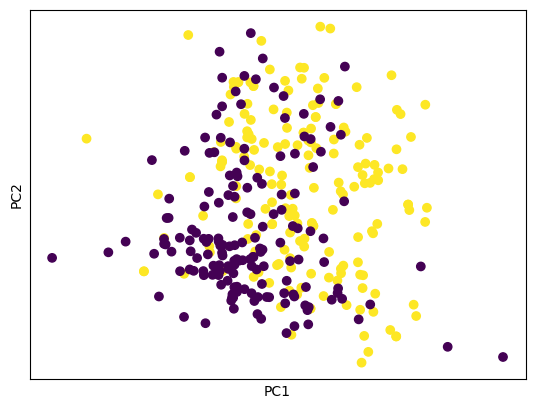

In [ ]:
from sklearn.preprocessing import StandardScaler
X_std = StandardScaler().fit_transform(X_Hep)

from sklearn.decomposition import PCA
pca_Hep = PCA(n_components = 2).fit(X_std)

print('Components:\n', pca_Hep.components_)
print('Explained variance ratio:\n', pca_Hep.explained_variance_ratio_)
X_pca = pca_Hep.transform(X_std) # Apply dimensionality reduction to X.
print('Transformed data shape:', X_pca.shape)

plt.scatter(X_pca[:, 0], X_pca[:, 1], c = Y_Hep)
plt.xlabel('PC1'); plt.xticks([])
plt.ylabel('PC2'); plt.yticks([])
plt.show()